In [211]:
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.geometry import Polygon
from rasterio.mask import mask
from rasterio.plot import show
from matplotlib import pyplot as plt
from matplotlib.patches import Rectangle
import textwrap
from matplotlib.text import Text

import Plot_Tricks as pt
import Maps as Maps
import ResultsPlots as RS
from shapely.geometry import box 
import matplotlib.image as mpimg

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import importlib
importlib.reload(RS)
importlib.reload(pt)
importlib.reload(Maps)
% matplotlib inline

In [432]:
HeaderFont = 60
HeadSpace = 25
pad = 10
HeadPad = HeadSpace + pad
TextFont = 34
SubTextfont = 30
SmallTextfont = 24

Major_Label_Font = 30
Minor_Label_Font = 20


HeaderPad = 35
pane_y_pad = 20

Background_Color = (.9,.9,.9)
dpi = 300

UBC_Blue = '#002145'#(.1,.3,.6)

xoff = 5



def mm_in(Size):
    Size=(Size[0]*0.0393701,Size[1]*0.0393701)
    return(Size)

def Section(w,h):
    Size = mm_in((w,h))
    fig,ax = plt.subplots(1,1,figsize=Size)
    fig.subplots_adjust(left=0, bottom=0, right=1, top=1)
    x = np.arange(0, w, w/10)
    y = np.arange(0, h, h/10)
    ax.set_facecolor(Background_Color)
    ax.set_xlim(0,w)
    ax.set_ylim(0,h)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    return(fig,ax)

def rec_pos(w1,h1,x1,y1,w2,h2):
    rect = [x1/w1,y1/h1,w2/w1,h2/h1]
    return(rect)

def Header(ax,h,w,Header):
    ax.add_patch(Rectangle((0,h-HeadSpace),w,HeadSpace,
                           facecolor = UBC_Blue,edgecolor='black',figure=fig))
    ax.text(xoff,h-HeadSpace+5,Header,fontsize = HeaderFont,color = 'white')
    
class TextWrap:
    def __init__(self):
        self.Replace={'CO2':'CO$_2$','CH4':'CH$_4$','13th':'13$^{th}$','23rd':'23$^{rd}$','km2':'km$^2$',
                     'm-2':'m$^{-2}$','d-1':'d$^{-1}$','Ta':'T$_a$','Tp':'T$_p$','zm':'z$_m$','Wt':'W$_T$',
                     'Sphagnum':'$Sphagnum$','Equisetum':'$Equisetum$','Carex':'$Carex$',
                      'Salix':'$Salix$','Eriophorum':'$Eriophorum$'}
    def Wrap(self,Text_to_fromat,Width):
        Text = []
        for i,line in enumerate(Text_to_fromat.splitlines()):
            if line[0]=='-':
                wrapped_line = textwrap.fill(line,Width,subsequent_indent='  ')
            elif line[0]=='|':
                Text.append('\n')
                line=line.replace('|','')
                wrapped_line = textwrap.fill(line,Width,subsequent_indent='  ')
            elif line[0]=='*':
                line=line.replace('*','-')
                wrapped_line = textwrap.fill(line,Width,initial_indent='  ',subsequent_indent='    ')
            elif line[0]=='>':
                line=line.replace('>','-')
                wrapped_line = textwrap.fill(line,Width,initial_indent='    ',subsequent_indent='      ')
            else:
                wrapped_line = textwrap.fill(line,Width,initial_indent='',subsequent_indent='')
            Text.append(wrapped_line)
        Text = '\n'.join(text for text in Text)
        
        for rep in self.Replace:
            Text = Text.replace(rep,self.Replace[rep])
        return(Text)
    
    def Paragraph(self,Text,Width):
        Text = textwrap.fill(Text,Width)
        for rep in self.Replace:
            Text = Text.replace(rep,self.Replace[rep])
        return(Text)
    
    
TW = TextWrap()
   
Pic1 = "C:\\FishIsland_2017\\Pictures\\Drone\\7_12\\Oblique/DJI_0323.jpg"
Pic2 = "C:\\FishIsland_2017\\Pictures\\Drone\\9_13\\Oblique/DJI_0592.jpg"
Pic3 = "C:\\FishIsland_2017\\Pictures\\Personal/P6220056.jpg"

def Im1(ax):
    img=mpimg.imread(Pic1)
    imgplot = ax.imshow(img)
    ax.set_xlim(1000,5000)
    ax.set_ylim(3000,500)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

def Im2(ax):
    img=mpimg.imread(Pic2)
    imgplot = ax.imshow(img)
#     ax.set_xlim(1000,5000)
#     ax.set_ylim(3000,500)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    
def Im3(ax):
    img=mpimg.imread(Pic3)
    imgplot = ax.imshow(img)
#     ax.set_xlim(1000,5000)
#     ax.set_ylim(3000,500)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

DataPath = 'C:/FishIsland_2017/FilteredData2018-04-06.csv'
FilledPath_ch4 = 'C:/FishIsland_2017/GapFilledfch4.csv'
SummaryPath_ch4 = 'C:/FishIsland_2017/GapFillingSummaryfch4.csv'
FilledPath_co2 = 'C:/FishIsland_2017/GapFilledfco2.csv'
SummaryPath_co2 = 'C:/FishIsland_2017/GapFillingSummaryfco2.csv'

# Abstract

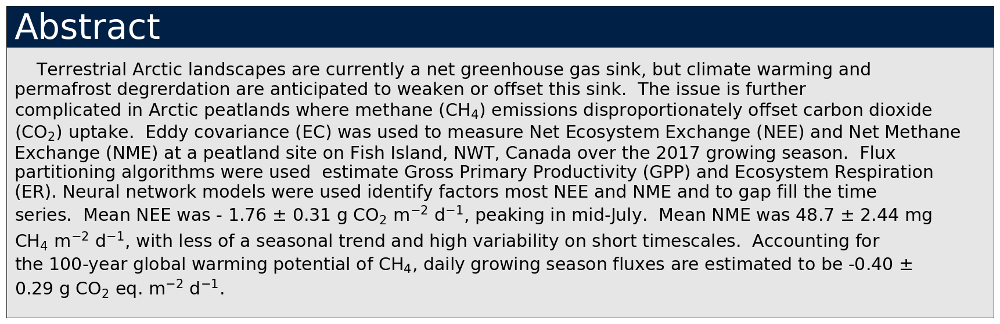

In [330]:
Par1 = r"    Terrestrial Arctic landscapes are currently a net greenhouse gas sink, "+\
"but climate warming and permafrost degrerdation are anticipated to weaken or offset this sink."+\
"  The issue is further complicated in Arctic peatlands where methane (CH4) emissions "+\
"disproportionately offset carbon dioxide (CO2) uptake.  Eddy covariance (EC) was used to measure"+\
" Net Ecosystem Exchange (NEE) and Net Methane Exchange (NME) at a peatland site on "+\
"Fish Island, NWT, Canada over the 2017 growing season.  Flux partitioning algorithms were used "+\
" estimate Gross Primary Productivity (GPP) and Ecosystem Respiration (ER)."+\
" Neural network models were used identify factors most NEE and NME and to "+\
"gap fill the time series.  Mean NEE was"+\
" - 1.76 ± 0.31 g CO2 m-2 d-1, peaking in mid-July."+\
"  Mean NME was 48.7 ± 2.44 mg CH4 m-2 d-1, with less of a"+\
" seasonal trend and high variability on short timescales.  Accounting for the 100-year global warming"+\
" potential of CH4, daily growing season fluxes are estimated to be -0.40 ± 0.29 g CO2 eq. m-2 d-1."

Abstract_W = 600
Abstract_H = 190

fig,ax=Section(Abstract_W,Abstract_H)
Header(ax,Abstract_H,Abstract_W,Header = 'Abstract')
ax.text(5,Abstract_H-HeadPad,TW.Paragraph(Par1,103),fontsize = SubTextfont,verticalalignment='top')
plt.savefig("C:/FishIsland_2017/EGU/Abstract.png",dpi = dpi)

# Site and Data

C:\Anaconda3\lib\site-packages\pandas\core\indexing.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


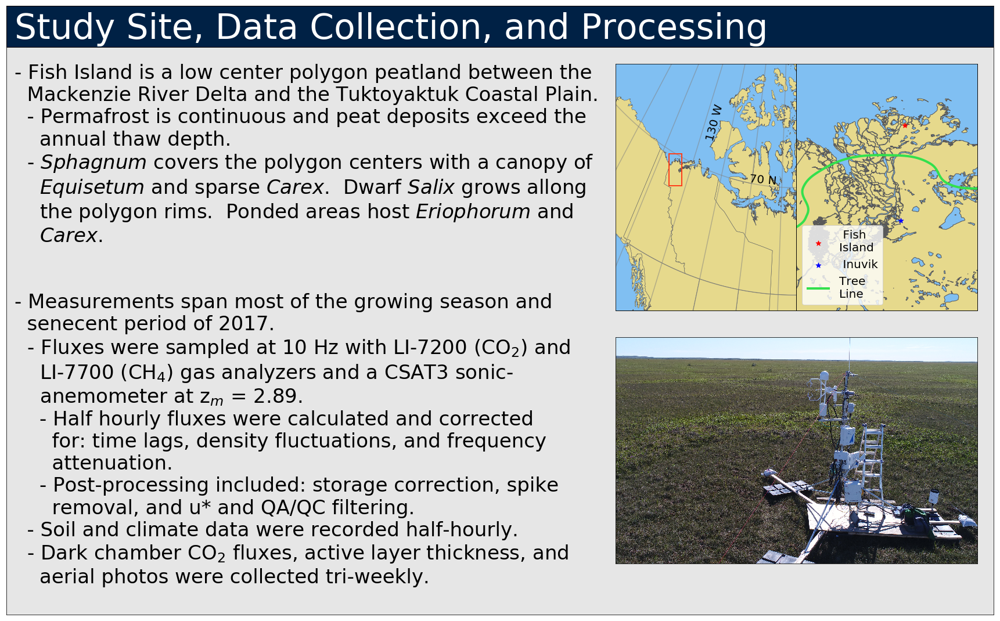

In [393]:
Par1 = "- Fish Island is a low center polygon peatland between the Mackenzie River Delta and the Tuktoyaktuk Coastal Plain.\n* Permafrost is continuous and peat deposits exceed the annual"+\
" thaw depth.\n* Sphagnum covers the polygon centers with a canopy of Equisetum and sparse"+\
" Carex.  Dwarf Salix grows allong the polygon rims.  Ponded areas host Eriophorum and Carex."


Par2 = "|- Measurements span most of the growing season and senecent period of 2017.\n* Fluxes were sampled at 10 Hz with LI-7200 (CO2) and LI-7700 (CH4) gas analyzers"+\
" and a CSAT3 sonic-anemometer at zm = 2.89.\n> Half hourly fluxes were calculated and corrected for: time lags, density fluctuations, and frequency attenuation.\n"+\
"> Post-processing included: storage correction, spike removal, and u* and QA/QC filtering.\n* Soil and climate data were recorded half-hourly.\n* Dark chamber CO2 fluxes, active layer thickness, and"+\
" aerial photos were collected tri-weekly."

Par4 = "- The CO2 fluxes represent Net Ecosystem Exchange (NEE): the sum of Ecosystem Respiration (ER) and Gross Primary Productivity (GPP)."+\
"-Due to the lack of nocturnal conditions over much of the study period GPP and ER were fit "+\
"to light and temperature resonse curves simultaneously"+\
"There were ignificant phenology changes over the study period (Figure XX), so seperate fits were calculated for each month"

Text = Par1+'\n'+Par2#+'\n'+Par3

importlib.reload(Maps)
Site_W = 600
Site_H = 370
Text_W = 58

fig,ax = Section(Site_W,Site_H)
Header(ax,Site_H,Site_W,Header = 'Study Site, Data Collection, and Processing')
ax.text(xoff,Site_H-HeadPad,TW.Wrap(Text,Text_W),fontsize = TextFont,verticalalignment='top')
Map_H = 150
Map_W = 220
Map_X = 370
Map_Y = Site_H-HeadPad-Map_H
rect = rec_pos(Site_W,Site_H,Map_X,Map_Y,Map_W,Map_H)
ax1 = pt.add_subplot_axes(ax,rect)
Maps.Intro_Map(ax1,Major_Label_Font,Minor_Label_Font,clipped=True)

# Row2 = 400
Pic_H = Map_H
Pic_W = Map_W
Pic_X = Map_X
Pic_Y = Map_Y-Pic_H-pad
rect = rec_pos(Site_W,Site_H,Pic_X,Pic_Y,Pic_W,Pic_H)
ax2 = pt.add_subplot_axes(ax,rect)
Im1(ax2)
# ax.text(xoff,Row2,TW.Wrap(Par2,Text_W),fontsize = TextFont,verticalalignment='top')

# Row3 = 230
# # Pic_H = Map_H
# # Pic_W = Map_W
# # Pic_X = Map_X
# # Pic_Y = Row3-Pic_H
# # rect = rec_pos(Site_W,Site_H,Pic_X,Pic_Y,Pic_W,Pic_H)
# # ax3 = pt.add_subplot_axes(ax,rect)
# # # Im2(ax3)
# ax.text(xoff,Row3,TW.Wrap(Par3,Text_W),fontsize = TextFont,verticalalignment='top')


plt.savefig("C:/FishIsland_2017/EGU/SiteandData.png",dpi = dpi)

# Phenology Changes

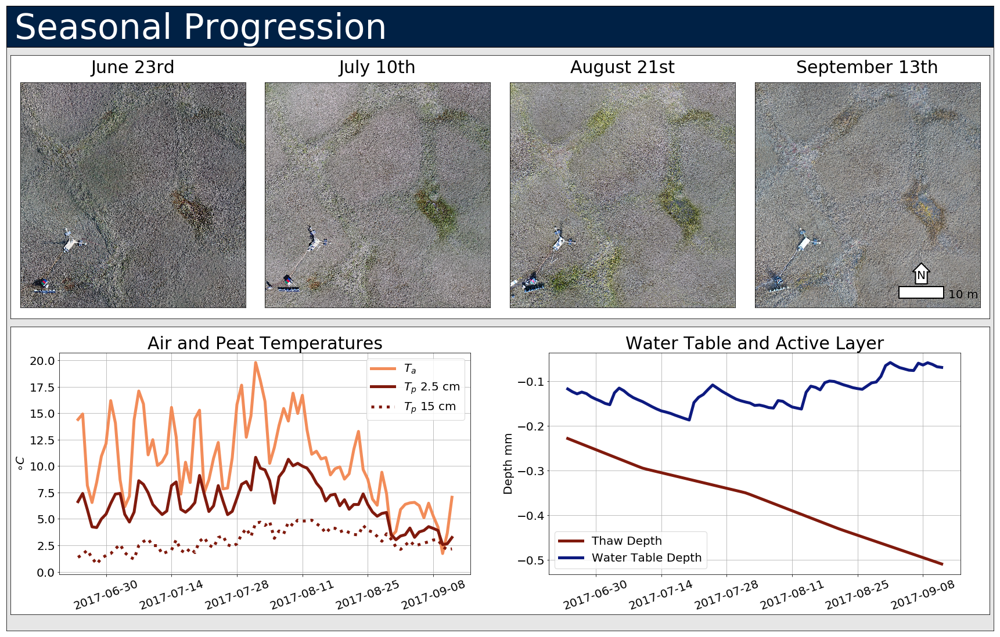

In [188]:
importlib.reload(Maps)
importlib.reload(RS)

Veg_W = 600
Veg_H = 380
Text_W = 100
# Eq_Space = 30
Pad = 30
fig,ax = Section(Veg_W,Veg_H)

Header(ax,Veg_H,Veg_W,Header = 'Seasonal Progression')

rect = rec_pos(Veg_W,Veg_H,2.5,190,595,160)
ax1 = pt.add_subplot_axes(ax,rect)
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)

x1 = 504665.0
y1 = 7695865.0
x2 = x1+50
y2 = y1+50
bounds = [x1,y1,x2,y2]

xs,ys = 0.23,.92
x1,y1 = 0.01,0.01
x2,y2 = 0.26,0.01
x3,y3 = 0.51,0.01
x4,y4 = 0.76,0.01
pos=xs,ys,x1,y1,x2,y2,x3,y3,x4,y4

PC = Maps.Phenology_Change(ax1,Major_Label_Font,Minor_Label_Font,bounds,pos)
Units = 10
Posx = 32
Posy = 2
Posx2 = 37
Posy2 = 7
size = 12
PC.Scale(PC.ax4,Units,Posx,Posy,Posx2,Posy2,size)


results = RS.Results(DataPath,FilledPath_ch4,SummaryPath_ch4,FilledPath_co2,SummaryPath_co2,Major_Label_Font,Minor_Label_Font)

rect = rec_pos(Veg_W,Veg_H,2.5,10,595,175)
ax2 = pt.add_subplot_axes(ax,rect)
# ax2.set_title('Figure Y',fontsize=Major_Label_Font)
results.Climate(ax2)

plt.savefig("C:/FishIsland_2017/EGU/VegClimate.png",dpi = dpi)

# Results

KeyError: 'Model: air pressure+PPFD+Active Layer'

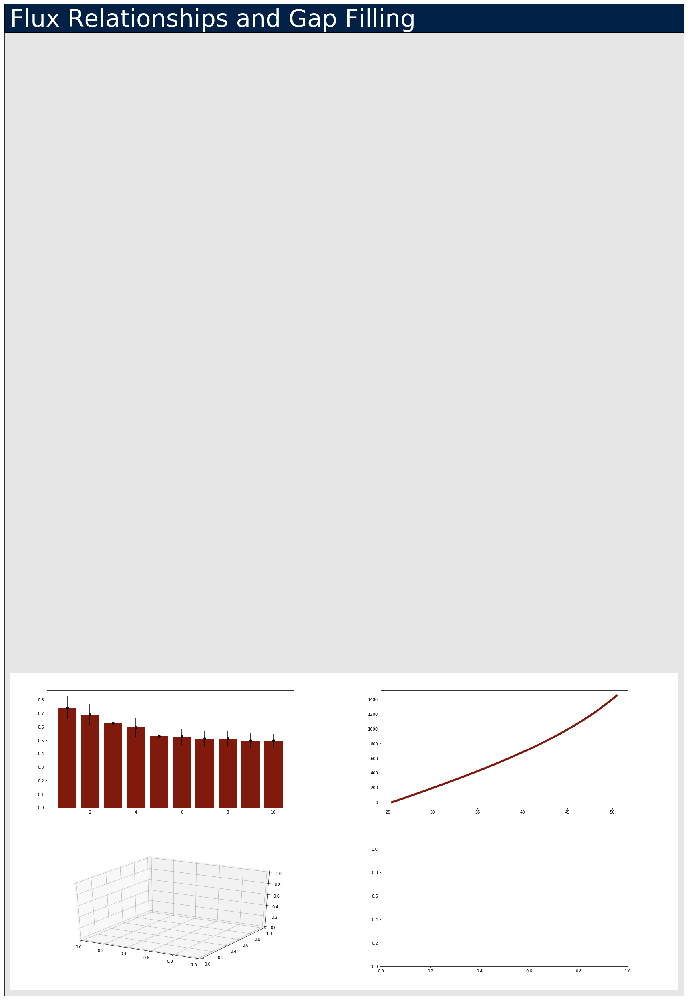

In [433]:
importlib.reload(RS)
importlib.reload(pt)
results = RS.Results(DataPath,FilledPath_ch4,SummaryPath_ch4,FilledPath_co2,SummaryPath_co2,Major_Label_Font,Minor_Label_Font)

Par1 = '* Modeling GPP and ER are relatively straighforward.  PPFD and temperature are the dominate controls, there are others (eg. water table depth, )'

Par2 = '* '

Gap_W,Gap_H=600,875

fig,ax = Section(Gap_W,Gap_H)
Header(ax,Gap_H,Gap_W,Header = 'Flux Relationships and Gap Filling')

W = 590
NN_H = 280
Emp_H = 250
Bot_X = 5
Bot_Y = 5


rect = rec_pos(Gap_W,Gap_H,Bot_X,Bot_Y,W,NN_H)
ax1 = pt.add_subplot_axes(ax,rect)
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)
results.CH4(ax1,fig)

MidY = Bot_Y+NN_H+Bot_Y
rect = rec_pos(Gap_W,Gap_H,Bot_X,MidY,W,NN_H)
ax2 = pt.add_subplot_axes(ax,rect)
ax2.get_xaxis().set_visible(False)
ax2.get_yaxis().set_visible(False)
results.CO2(ax2,fig)

TopY=MidY+NN_H+Bot_Y
rect = rec_pos(Gap_W,Gap_H,Bot_X,TopY,W,Emp_H)
ax3 = pt.add_subplot_axes(ax,rect)
ax3.get_xaxis().set_visible(False)
ax3.get_yaxis().set_visible(False)
results.GPP_ER(ax3)


plt.savefig("C:/FishIsland_2017/EGU/GapFilling.png",dpi = dpi)


Cbal_W,Cbal_H=600,300

fig,ax = Section(Cbal_W,Cbal_H)

Header(ax,Cbal_H,Cbal_W,Header = 'Growing Season Carbon Balance')
# ax.text(0,h-20,r'Cballusions',fontsize = HeaderFont)
ax.text(xoff,Cbal_H-60,Cbal_L1,fontsize = TextFont)
# ax.text(0,h-100,Cball_L2,fontsize = TextFont)
# ax.text(0,h-140,Cball_L3,fontsize = TextFont)
# plt.text(0,h,r'$\frac{3}{4} \binom{3}{4} \stackrel{3}{4}$',fontsize = 40)

rect = rec_pos(Gap_W,Gap_H,5,180,590,400)
ax1 = pt.add_subplot_axes(ax,rect)
results.C_Balance(ax1)
# ax.grid()

plt.savefig("C:/FishIsland_2017/EGU/Cbalance.png",dpi=dpi)

# Conclusions

In [138]:
Concl_L1 = "- Fish Island is a net carbon sink over the growing season."
Concl_L2 = "- CH4 emissions are high relative to similar landscapes (Sachs et al. 2008)"
Concl_L3 = "- On an annual the site is probably a source GHGs"

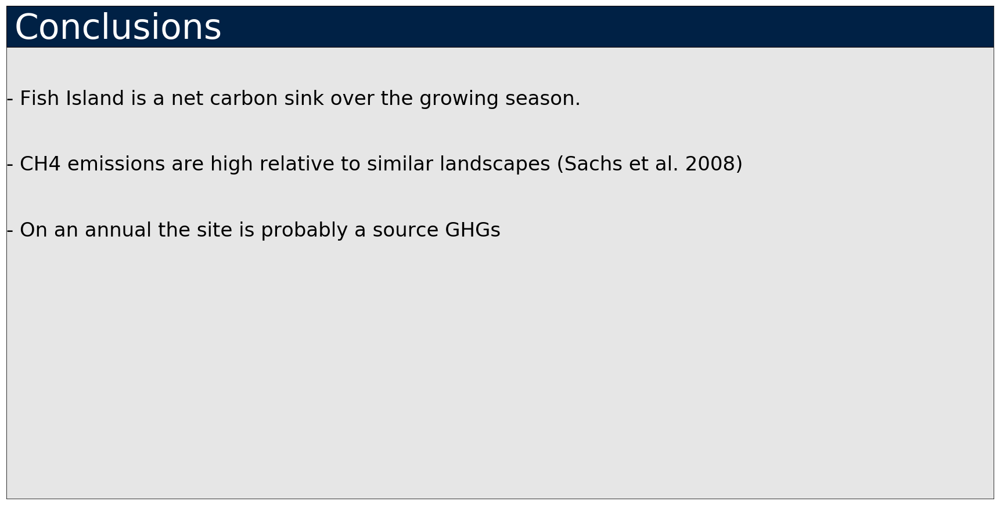

In [23]:
Conc_W,Conc_H=600,300

fig,ax = Section(Conc_W,Conc_H)

Header(ax,Conc_H,Conc_W,Header = 'Conclusions')
# ax.text(0,h-20,r'Conclusions',fontsize = HeaderFont)
ax.text(0,h-60,Concl_L1,fontsize = TextFont)
ax.text(0,h-100,Concl_L2,fontsize = TextFont)
ax.text(0,h-140,Concl_L3,fontsize = TextFont)
# plt.text(0,h,r'$\frac{3}{4} \binom{3}{4} \stackrel{3}{4}$',fontsize = 40)
ax.grid()

plt.savefig("C:/FishIsland_2017/EGU/Conclusions.png",dpi=dpi)



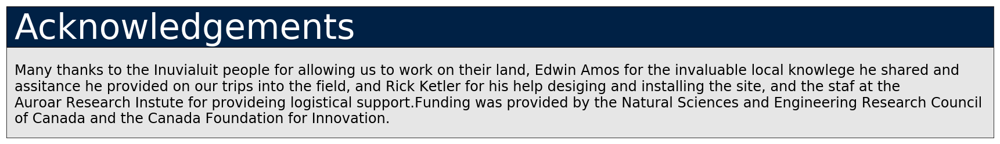

In [350]:
Ack_W,Ack_H=600,80

AckText = "Many thanks to the Inuvialuit people for allowing us to work on their land, Edwin Amos for the invaluable local knowlege he shared"+\
" and assitance he provided on our trips into the field, and Rick Ketler for his help desiging and installing the site, and the staf at the Auroar Research Instute for provideing logistical support."+\
"Funding was provided by the Natural Sciences and Engineering Research Council of Canada and the Canada Foundation for Innovation."

fig,ax = Section(Ack_W,Ack_H)

Header(ax,Ack_H,Ack_W,Header = 'Acknowledgements')
ax.text(xoff,Ack_H-HeadPad,TW.Paragraph(AckText,135),fontsize = SmallTextfont,verticalalignment='top')

plt.savefig("C:/FishIsland_2017/EGU/Acknowledgements.png",dpi=dpi)

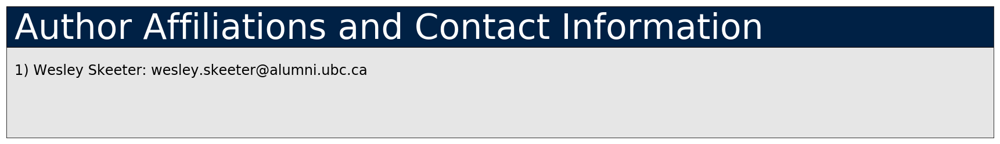

In [352]:
Cont_W,Cont_H=600,80

ContText = "1) Wesley Skeeter: wesley.skeeter@alumni.ubc.ca"

fig,ax = Section(Cont_W,Cont_H)

Header(ax,Cont_H,Cont_W,Header = 'Author Affiliations and Contact Information')
ax.text(xoff,Cont_H-HeadPad,TW.Paragraph(ContText,135),fontsize = SmallTextfont,verticalalignment='top')

plt.savefig("C:/FishIsland_2017/EGU/Contacts.png",dpi=dpi)

# Putting it all together

NameError: name 'EGH_H' is not defined

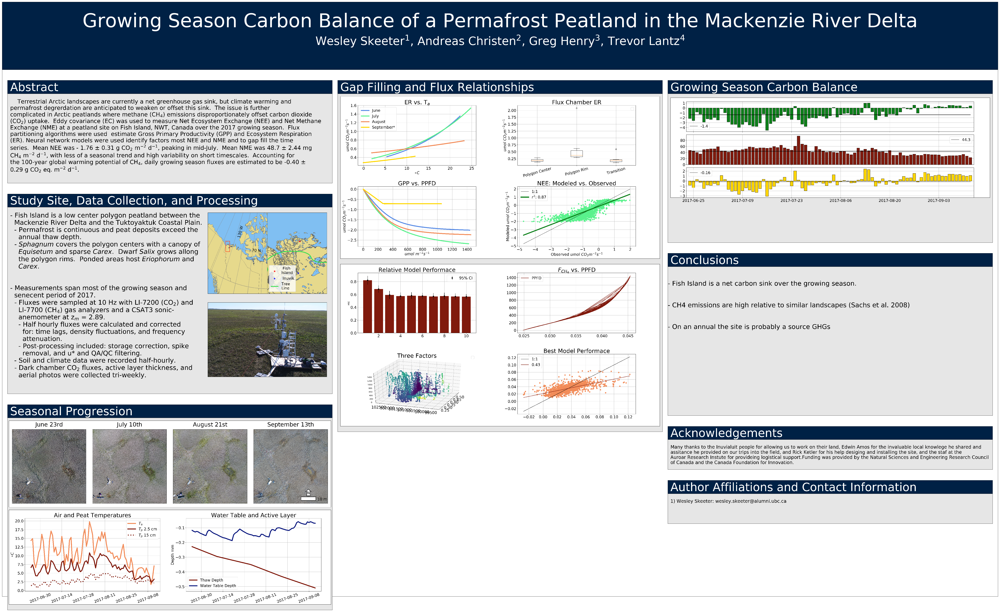

In [357]:
w,h = 1840,1100

TitleFont = 100
TitleSpace = 125
TitlePad = 20
AuthoPad = 40
# fig,ax=Section(w,h)

Size = mm_in((w,h))
fig,ax = plt.subplots(1,1,figsize=Size)
fig.subplots_adjust(left=0, bottom=0, right=1, top=1)
x = np.arange(0, w, w/10)
y = np.arange(0, h, h/10)
ax.set_facecolor('white')
ax.set_xlim(0,w)
ax.set_ylim(0,h)
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

ax.add_patch(Rectangle((0,h-TitleSpace),w,TitleSpace,
                       facecolor = UBC_Blue,edgecolor='black',figure=fig))
Title_Y = h-TitlePad
ax.text(w/2,Title_Y,
        'Growing Season Carbon Balance of a Permafrost Peatland in the Mackenzie River Delta',
        verticalalignment='top',horizontalalignment='center',fontsize = TitleFont,color = 'white')
Author_y = Title_Y-AuthoPad
ax.text(w/2,Author_y,
        'Wesley Skeeter$^1$, Andreas Christen$^2$, Greg Henry$^3$, Trevor Lantz$^4$',
        verticalalignment='top',horizontalalignment='center',fontsize = HeaderFont,color = 'white')


def MakePane(ax,file):
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    img=mpimg.imread(file)
    imgplot = ax.imshow(img)
    
PaneTops = h-(TitleSpace+TitlePad)
leftX = 10
midX = 620
rightX = 1230

# Abstract
Abstract_Y = PaneTops-Abstract_H
Abstract_X = leftX

rect = rec_pos(w,h,Abstract_X,Abstract_Y,Abstract_W,Abstract_H)
ax1 = pt.add_subplot_axes(ax,rect)
MakePane(ax1,"C:/FishIsland_2017/EGU/Abstract.png")

# Site & Data
Site_Y = Abstract_Y - pane_y_pad - Site_H
Site_X = leftX
rect = rec_pos(w,h,leftX,Site_Y,Site_W,Site_H)
ax2 = pt.add_subplot_axes(ax,rect)
MakePane(ax2,"C:/FishIsland_2017/EGU/SiteandData.png")


# Vege & Climate
Veg_Y = Site_Y-Veg_H - pane_y_pad
rect = rec_pos(w,h,leftX,Veg_Y,Veg_W,Veg_H)
ax3 = pt.add_subplot_axes(ax,rect)
MakePane(ax3,"C:/FishIsland_2017/EGU/VegClimate.png")

Gap_Y = PaneTops - Gap_H
rect = rec_pos(w,h,midX,Gap_Y,Gap_W,Gap_H)
ax4 = pt.add_subplot_axes(ax,rect)
MakePane(ax4,"C:/FishIsland_2017/EGU/GapFilling.png")

Cbal_Y = PaneTops-Cbal_H
rect = rec_pos(w,h,rightX,Cbal_Y,Cbal_W,Cbal_H)
ax1 = pt.add_subplot_axes(ax,rect)
MakePane(ax1,"C:/FishIsland_2017/EGU/Cbalance.png")


Conc_Y = Cbal_Y-Conc_H - pane_y_pad
rect = rec_pos(w,h,rightX,Conc_Y,Conc_W,Conc_H)
ax1 = pt.add_subplot_axes(ax,rect)
MakePane(ax1,"C:/FishIsland_2017/EGU/Conclusions.png")

Ack_Y = Conc_Y-Ack_H - pane_y_pad
rect = rec_pos(w,h,rightX,Ack_Y,Ack_W,Ack_H)
ax1 = pt.add_subplot_axes(ax,rect)
MakePane(ax1,"C:/FishIsland_2017/EGU/Acknowledgements.png")

Cont_Y = Ack_Y-Cont_H - pane_y_pad
rect = rec_pos(w,h,rightX,Cont_Y,Cont_W,Cont_H)
ax1 = pt.add_subplot_axes(ax,rect)
MakePane(ax1,"C:/FishIsland_2017/EGU/Contacts.png")

## Can't forget the logogs!!!

EGU_H = 75
EGU_W = 75
EGU_X = w-EGU_W-10
EGU_Y = h-20-EGU_H
rect = rec_pos(w,h,EGU_X,EGU_Y,EGU_W,EGU_H)
ax1 = pt.add_subplot_axes(ax,rect)
MakePane(ax1,"C:/FishIsland_2017/EGU/Logos/egu_ospp_label_yellow.png")

# EGU_H = 50
# EGU_W = 50
# EGU_X = w-EGU_W-10
# EGU_Y = 10
# rect = rec_pos(w,h,rightX,Conc_Y,Conc_W,Conc_H)
# ax1 = pt.add_subplot_axes(ax,rect)
# MakePane(ax1,"C:/FishIsland_2017/EGU/Logos/egu_ospp_label_yellow.png")


plt.savefig("C:/FishIsland_2017/EGU/Poster.png",dpi = dpi)